In [56]:
from pathlib import Path

from PIL import Image

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as patches
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.gridspec as gridspec
from matplotlib.offsetbox import (TextArea, DrawingArea, OffsetImage,
                                  AnnotationBbox)
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib_scalebar.scalebar import ScaleBar

import tifffile

import numpy as np
from scipy.ndimage import rotate 

In [78]:
def read_3d_volume(fileName, nx, ny, nz, dtype=np.float32):

    #print('Reading 3D volume file: ', fileName)
    f = open(fileName, "rb")
    data = np.fromfile(f, dtype=dtype)

    #size = nx*ny*nz
    shape = (nz, ny, nx)

    return data.reshape(shape)

def project_left(vol):
    vol_rot = np.transpose(vol, axes=(2,1,0))
    return np.flipud(np.rot90(np.sum(vol_rot, axis=0)))

def project_top(vol):
    vol_rot = np.transpose(vol, axes=(1,2,0))
    return np.rot90(np.sum(vol_rot, axis=0))

def project_front(vol):
    return np.sum(vol, axis=0)

def make_three_projections(vol):
    
    im1 = project_front(vol)
    m1 = np.mean(im1)
    std1 = np.std(im1)
    
    im2 = project_left(vol)
    m2 = np.mean(im2)
    std2 = np.std(im2)
    
    im3 = project_top(vol)
    m3 = np.mean(im3)
    std3 = np.std(im3)
    
    return (im1, m1, std1), (im2, m2, std2), (im3, m3, std3)

def make_three_projections_new(vol):
    
    im1 = project_front(vol)
    m1 = np.mean(im1)
    std1 = np.std(im1)
    
    im2 = project_left(vol)
    m2 = np.mean(im2)
    std2 = np.std(im2)
    
    im3 = project_top(vol)
    m3 = np.mean(im3)
    std3 = np.std(im3)   
    
    results =  {'front': {'image':im1, 'mean': m1, 'std': std1},
               'left':   {'image':im2, 'mean': m2, 'std': std2},
               'top':    {'image':im3, 'mean': m3, 'std': std3}}
    
    return results

def read_slice_from_multi_tiff(path, slice_num):
    """
    path - Path to the multipage-tiff file
    n_images - Number of pages in the tiff file
    """
    img = Image.open(path)
    images = []
 
    img.seek(slice_num)
    
    slice_ = np.array(img)
    
    #slice_ = np.zeros((img.height, img.width))
            
    #for j in range(slice_.shape[0]):
    #    for k in range(slice_.shape[1]):
            #print j,k
    #        slice_[j,k] = img.getpixel((k, j))

    return slice_

def compute_fraction(bub_img, electr_img):
    frac_img = (bub_img + 0.01) / (electr_img + 0.01)
    frac_img[electr_img == 0] = 0
    
    return frac_img
    
    

def make_figure(dataset, bub_results, mask_result, sizeX= 15, sizeY=10):
    
    fig = plt.figure()

    fig.set_size_inches(sizeX, sizeY, forward=True)
    plt.subplots_adjust(top=0.90, bottom=0.0, left=0.0, right=0.9, wspace=0.02, hspace=0.02 )

    gs = gridspec.GridSpec(3, 2)
    
    vmin = 0.0
    vmax = 1.0
    
    
    # Projection 1: Front
    proj = 'front'
    bub_img = params_results[dataset]['01'][proj]['image']
    electr_img = mask_result[proj]['image']    
    frac_img = compute_fraction(bub_img, electr_img)
    
    ax0 = plt.subplot(gs[0, 0])
    plt.axis('off')
    plt.imshow(frac_img, cmap='turbo', aspect='auto', vmin = vmin, vmax = vmax)
    plt.title('before')
    #ax0.set_ylabel('100')
    #ax0.text(0.5, 0.5, 'top view', va="center", ha="center", fontsize=16)
    #ax0.text(0.5, 0.5,"top", va="center", ha="center", fontsize=16)   
    scalebar = ScaleBar(9.0, "um", length_fraction=0.25, location='lower left')
    ax0.add_artist(scalebar)
    
    bub_img = params_results[dataset]['02'][proj]['image']
    electr_img = mask_result[proj]['image']    
    frac_img = compute_fraction(bub_img, electr_img)
    
    ax1 = plt.subplot(gs[0, 1])
    plt.axis('off')
    im = plt.imshow(frac_img, cmap='turbo', aspect='auto', vmin = vmin, vmax = vmax)
    plt.title('after')
    #plt.show()
    # create an Axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(im, cax=cax, ticks=[0, 0.25,0.5,0.75, 1.0])
    cbar.ax.set_yticklabels(['0', '25', '50', '75', '100'])  # vertically oriented colorbar
    
    # Projection 2: Left
    proj = 'left'
    bub_img = params_results[dataset]['01'][proj]['image']
    electr_img = mask_result[proj]['image']    
    frac_img = compute_fraction(bub_img, electr_img) 
    
    ax2 = plt.subplot(gs[1, 0])
    plt.axis('off')
    plt.imshow(frac_img, cmap='turbo', aspect='auto')
    #plt.title('before')
    #ax0.set_ylabel('100')
    #ax0.text(0.5, 0.5, 'top view', va="center", ha="center", fontsize=16)
    #ax0.text(0.5, 0.5,"top", va="center", ha="center", fontsize=16)
    
    bub_img = params_results[dataset]['02'][proj]['image']
    electr_img = mask_result[proj]['image']    
    frac_img = compute_fraction(bub_img, electr_img)
    
    ax3 = plt.subplot(gs[1, 1])
    plt.axis('off')
    plt.imshow(frac_img, cmap='turbo', aspect='auto', vmin = vmin, vmax = vmax)
    #plt.title('after')
    #plt.show()
    
     # Projection 3: Top
    proj = 'top'
    bub_img = params_results[dataset]['01'][proj]['image']
    electr_img = mask_result[proj]['image']    
    frac_img = compute_fraction(bub_img, electr_img) 
    
    ax4 = plt.subplot(gs[2, 0])
    plt.axis('off')
    plt.imshow(frac_img, cmap='turbo', aspect='auto', vmin = vmin, vmax = vmax)
    #plt.title('before')
    #ax0.set_ylabel('100')
    #ax0.text(0.5, 0.5, 'top view', va="center", ha="center", fontsize=16)
    #ax0.text(0.5, 0.5,"top", va="center", ha="center", fontsize=16)
    
    bub_img = params_results[dataset]['02'][proj]['image']
    electr_img = mask_result[proj]['image']    
    frac_img = compute_fraction(bub_img, electr_img)
    
    ax4 = plt.subplot(gs[2, 1])
    plt.axis('off')
    plt.imshow(frac_img, cmap='turbo', aspect='auto', vmin = vmin, vmax = vmax)
    #plt.title('after')
    #plt.show()
    
    
    

    fig.suptitle(f'{dataset} mV', x=0.5, y=0.95, fontsize=18, va='top')

    fig.savefig(input_path / experiment / results_path / f'{dataset}_{param}mV_projections.png')
    

In [67]:
input_path = Path('Z:\\collaborations\\ulm-batteries\\processed\\A2021-031-019033\\')
masks_path = input_path / 'segmentation' / 'new_masks'
results_path = 'analysis_density_maps'

experiment = 'Experiment1'

#datasets = ['GFA','GFD', 'GDL']
#datasets = ['GFD']
#params = ['100', '200', '300']

#datasets = ["75mV", "125mV"]
#datasets = ["0mV", "75mV", "125mV", "150mV", "175mV_bis", "200mV_bis", "225mV_bis", "250mV", "275mV", "300mV"]
datasets = ["300mV"]
#datasets = ["125mV", "150mV", "175mV_bis", "200mV_bis", "225mV_bis", "250mV", "275mV", "300mV"]
corrections = ["0mV_01", "0mV_02", '175mV_bis_01', '175mV_bis_02', '225mV_bis_01', '275mV_01', '300mV_01', '300mV_02']

dataset = 'GDL'
param = '100'
frame = '01'

adjust_scale = True

v_scale = 2.0

nx = 976
ny = 976
nz = 976

crop_info = {'z1': 250, 'z2':750, 'x': 85, 'w': 800, 'y':0, 'h':700}

rotate_image = True
rotation_angle = 4.0

In [64]:
electrode_masks = {}

electr_mask_path = masks_path / f'Exp1_electr.raw'
electr_mask = read_3d_volume(electr_mask_path, nx, ny, nz, np.uint8)
electr_mask = electr_mask / 255

# Crop data

cr = crop_info
#vol = vol[cr['z1']:cr['z2'],cr['y']:cr['y']+cr['h'],cr['x']:cr['x']+cr['w']]
#labels = labels[cr['z1']:cr['z2'],cr['y']:cr['y']+cr['h'],cr['x']:cr['x']+cr['w']]
electr_mask = electr_mask[cr['z1']:cr['z2'],cr['y']:cr['y']+cr['h'],cr['x']:cr['x']+cr['w']]

if rotate_image:
    electr_mask = rotate(electr_mask, rotation_angle, reshape=False, axes=(1,2), order=0)
    electr_mask = electr_mask.astype(np.uint16)

In [65]:
mask_res = make_three_projections_new(electr_mask)

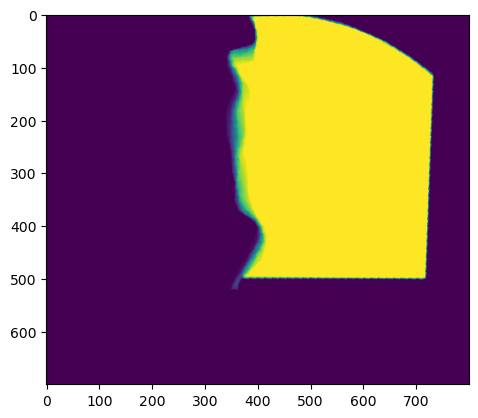

In [66]:
electr_img = mask_res['front']['image']
plt.imshow(electr_img)
tifffile.imwrite(str(input_path / experiment / results_path / f'electr.tif'), electr_img)

In [61]:
#plt.imshow(np.count_nonzero(electr_mask, axis=0))

## Read data

In [68]:
params_results = {}

for dataset in datasets:
    
    frames_results = {}
    
    for frame in ['01', '02']:

        #if dataset == 'GFD' and param == '100':
        #    fix = '_bis'
        #else:
        #    
        fix = ''
            
        bubbles_path = input_path / experiment / f"bubbles_{dataset}_tomo_{frame}-slices-pr_scaled2_8bit{fix}.tif"   
        #bubbles_path = input_path / experiment / f"{dataset}_{param}mV{fix}" / f"bubbles_{dataset}_{param}mV{fix}_tomo_{frame}-slices-pr_scaled2_8bit_align_v2.tif"
        print('Reading bubbles volume:', f"bubbles_{dataset}_{param}mV{fix}_tomo_{frame}")
        bubbles = tifffile.imread(str(bubbles_path))
        #air = labels.copy()
            
        bubbles[bubbles > 0] = 1
        
        if rotate_image:
            bubbles = rotate(bubbles, rotation_angle, reshape=False, axes=(1,2), order=0)
            bubbles = bubbles.astype(np.uint8)
            
              
        print('Making projections')
        res = make_three_projections_new(bubbles)
        print('Done!')
        
        frames_results[frame] = res
        
    params_results[dataset] = frames_results

Reading bubbles volume: bubbles_0mV_100mV_tomo_01
Making projections
Done!
Reading bubbles volume: bubbles_0mV_100mV_tomo_02
Making projections
Done!
Reading bubbles volume: bubbles_75mV_100mV_tomo_01
Making projections
Done!
Reading bubbles volume: bubbles_75mV_100mV_tomo_02
Making projections
Done!
Reading bubbles volume: bubbles_125mV_100mV_tomo_01
Making projections
Done!
Reading bubbles volume: bubbles_125mV_100mV_tomo_02
Making projections
Done!
Reading bubbles volume: bubbles_150mV_100mV_tomo_01
Making projections
Done!
Reading bubbles volume: bubbles_150mV_100mV_tomo_02
Making projections
Done!
Reading bubbles volume: bubbles_175mV_bis_100mV_tomo_01
Making projections
Done!
Reading bubbles volume: bubbles_175mV_bis_100mV_tomo_02
Making projections
Done!
Reading bubbles volume: bubbles_200mV_bis_100mV_tomo_01
Making projections
Done!
Reading bubbles volume: bubbles_200mV_bis_100mV_tomo_02
Making projections
Done!
Reading bubbles volume: bubbles_225mV_bis_100mV_tomo_01
Making pro

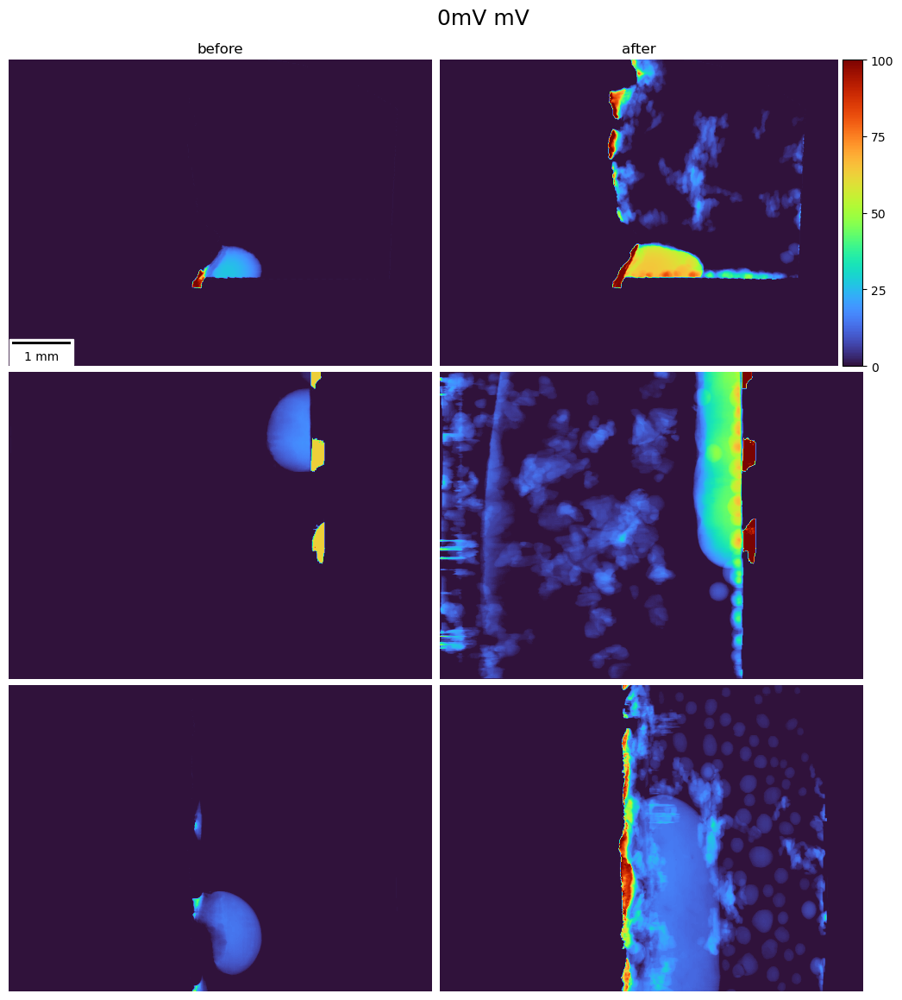

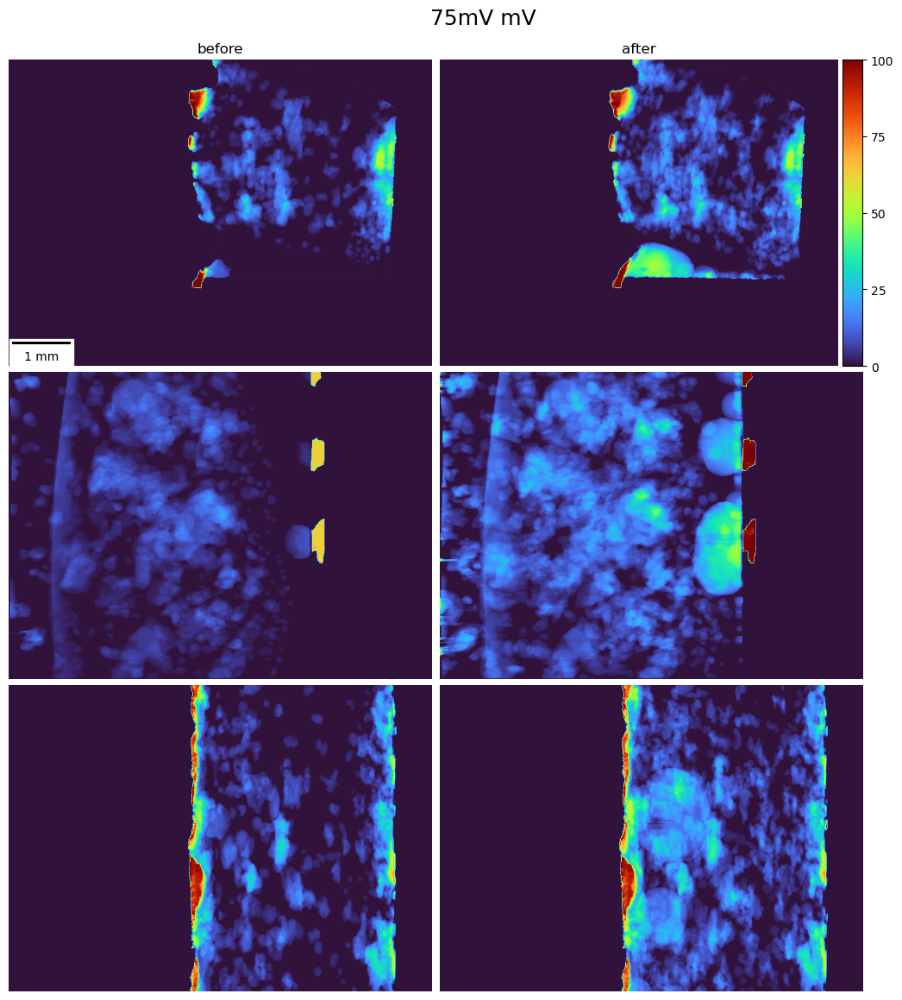

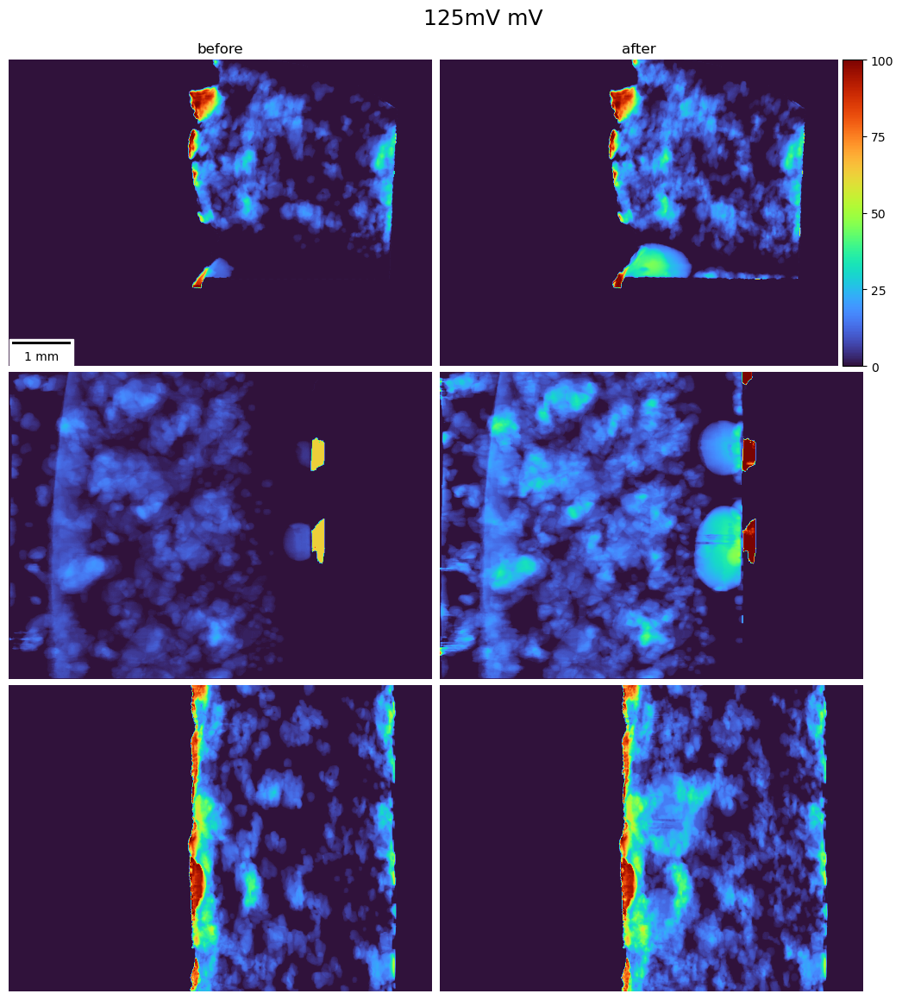

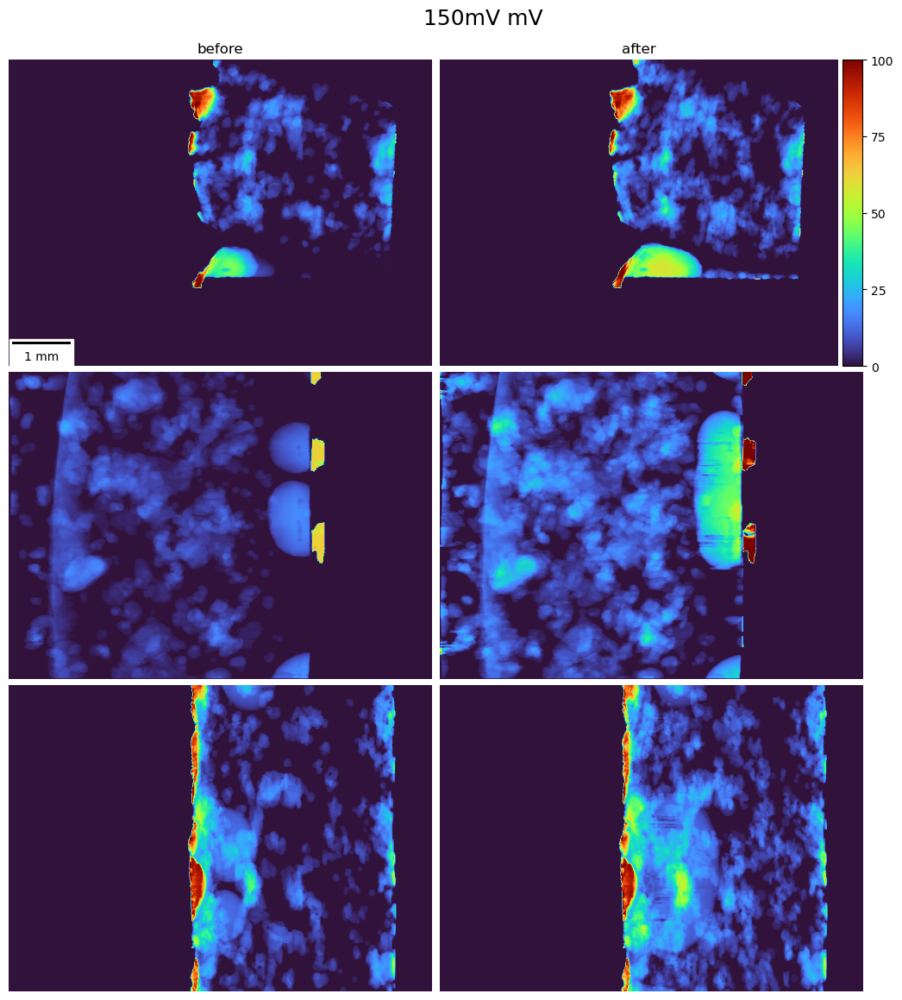

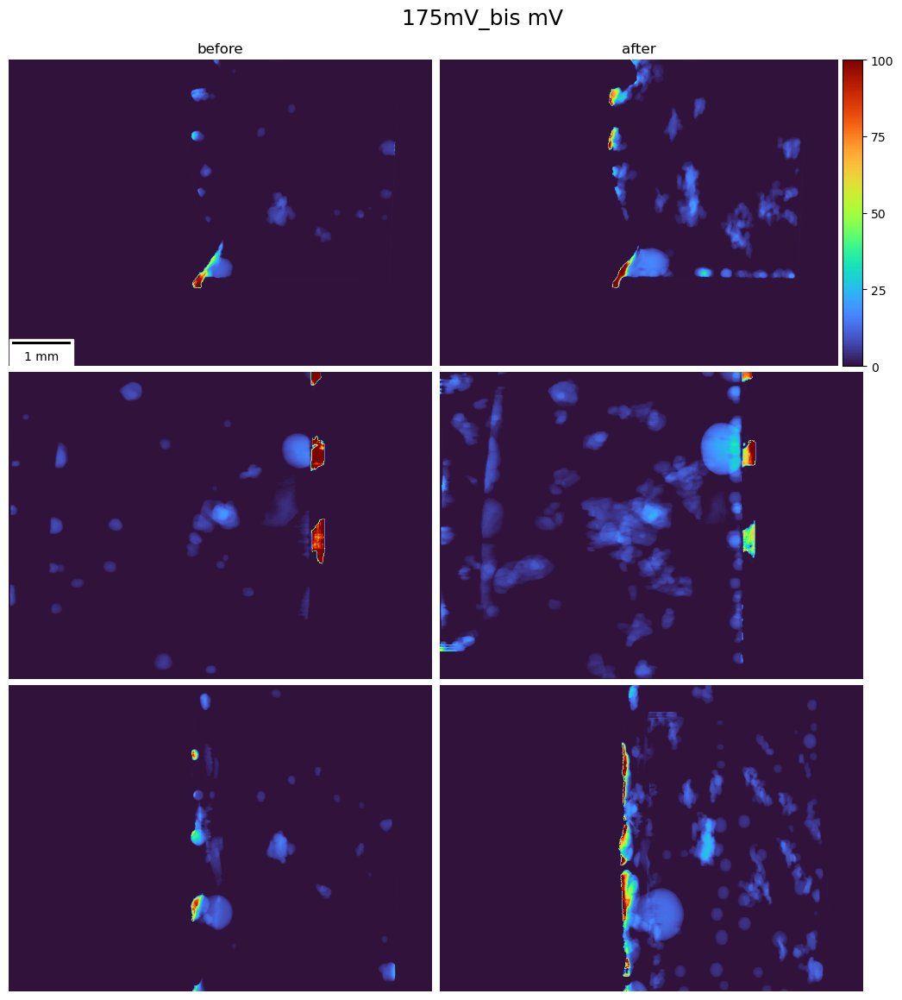

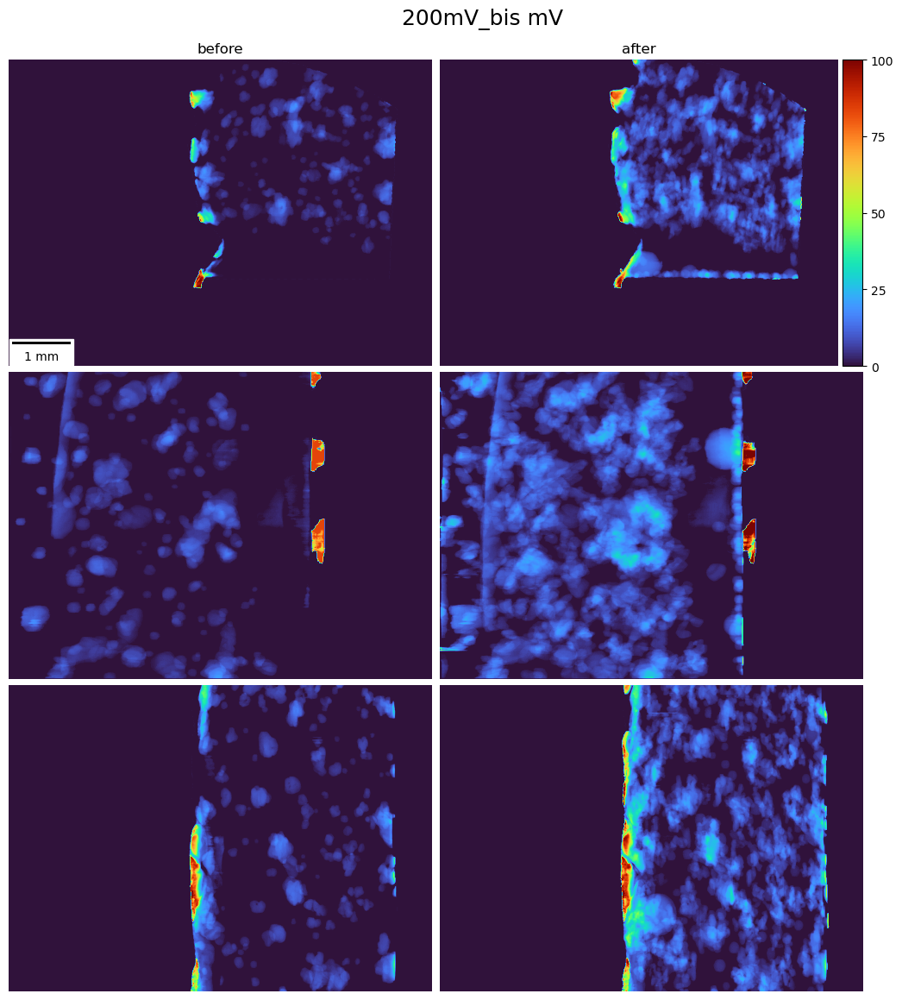

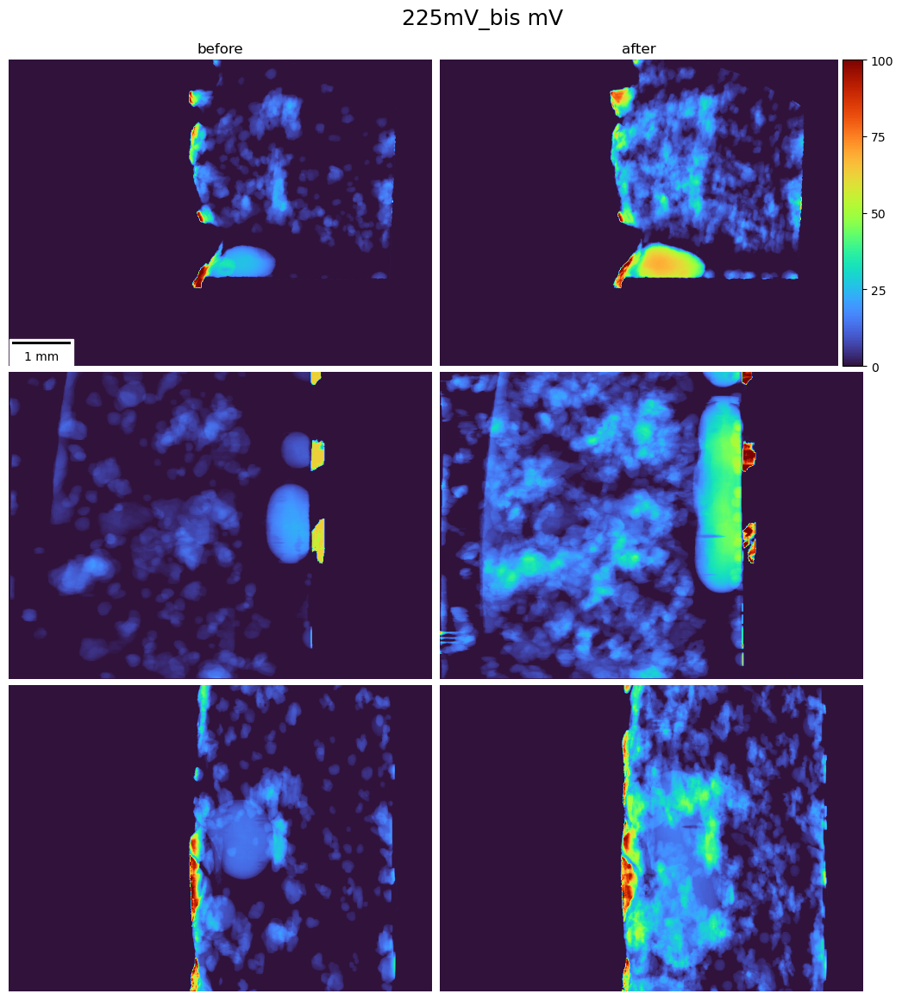

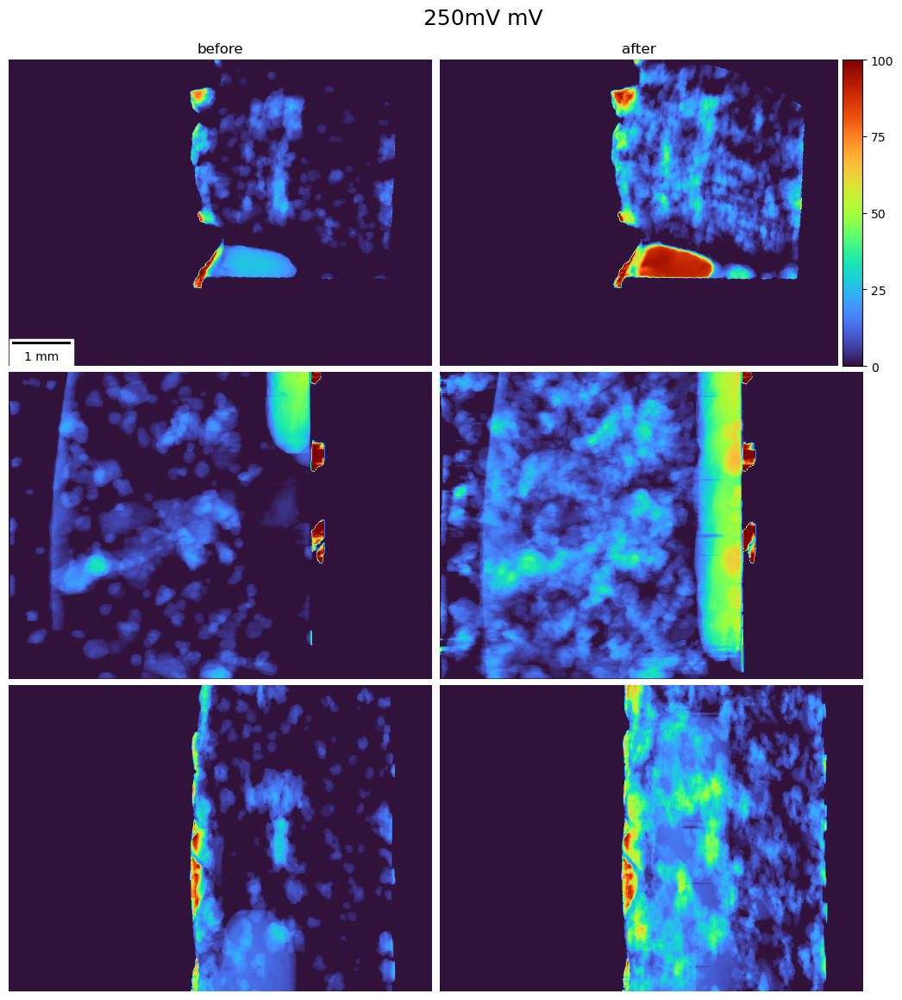

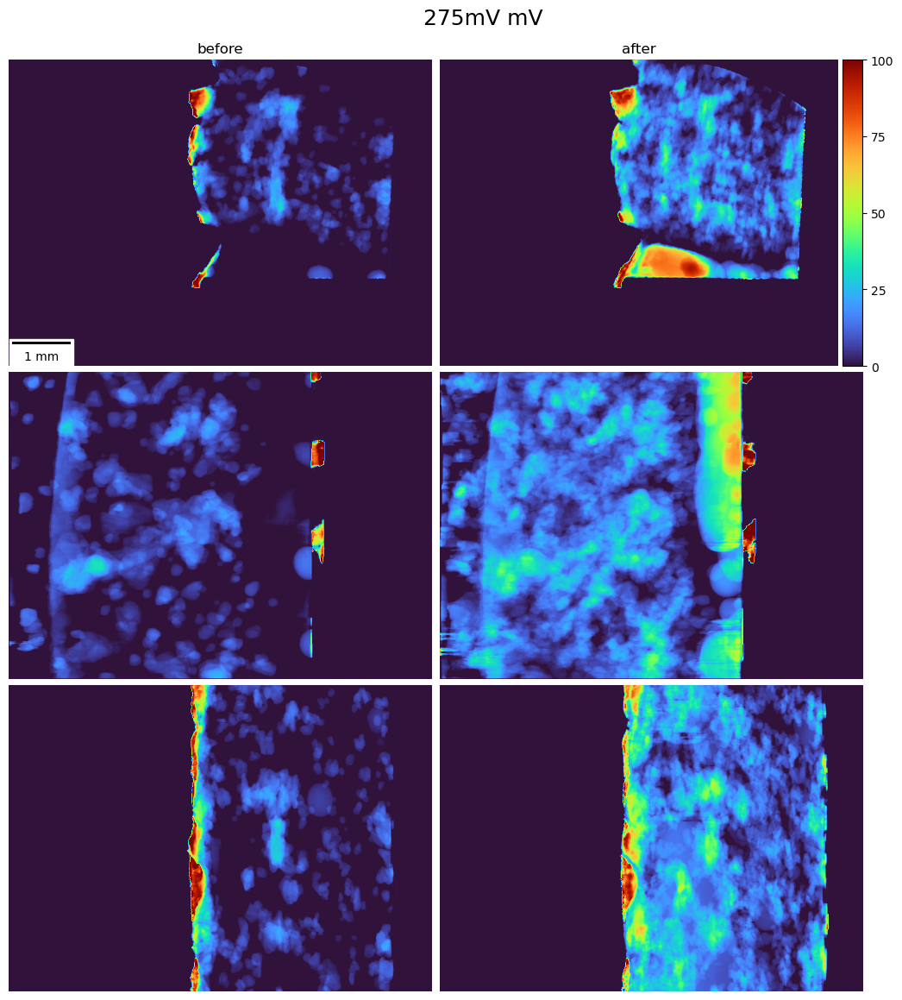

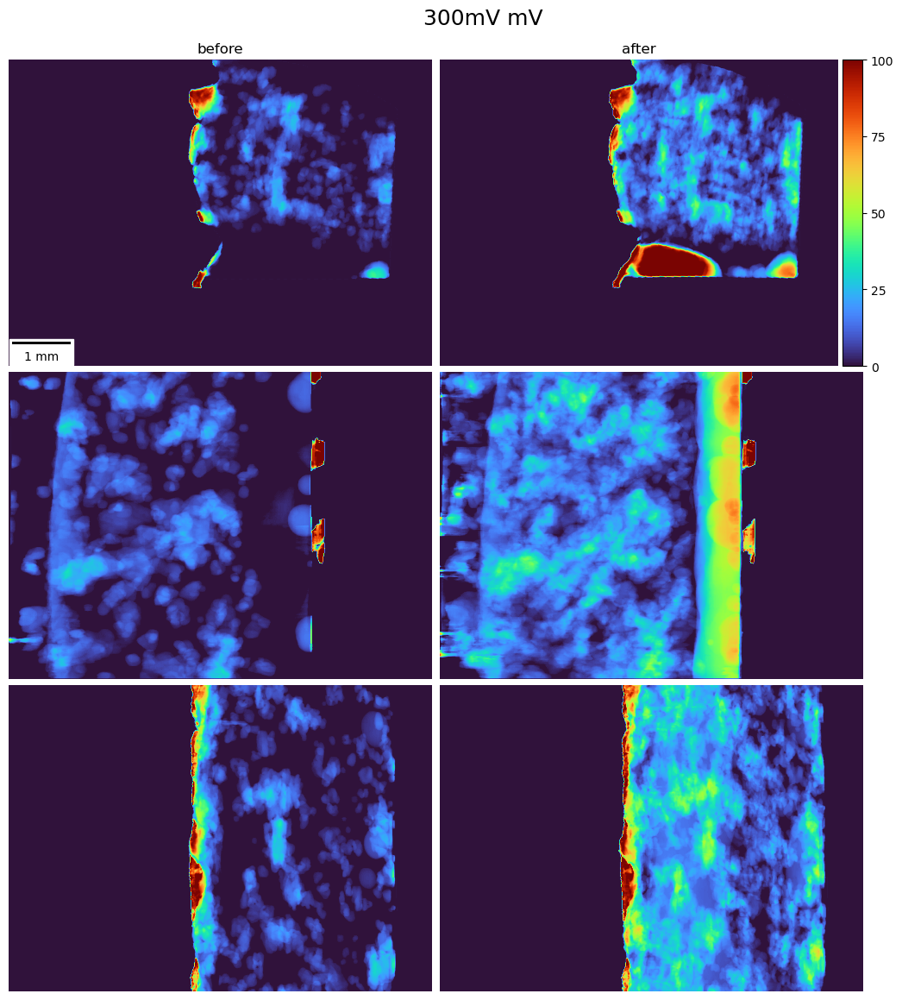

In [80]:
for dataset in datasets:
    make_figure(dataset, params_results, mask_res, sizeX=11, sizeY=12)  

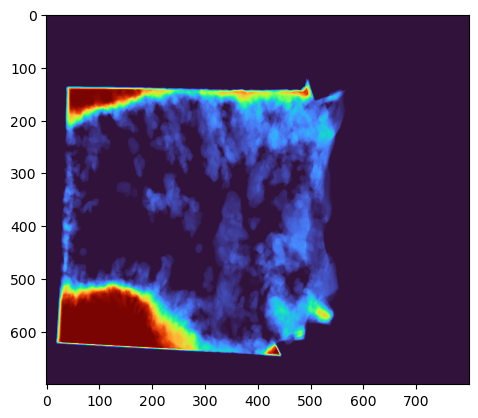

In [63]:

bub_img = params_results['300']['02']['front']['image']
plt.imshow(bub_img, cmap='turbo')

tifffile.imwrite(str(input_path / experiment / results_path / f'bub.tif'), bub_img)
#plt.savefig(input_path / experiment / results_path / f'test.png')

In [79]:
frac_img = (bub_img + 0.01) / (electr_img + 0.01)
tifffile.imwrite(str(input_path / experiment / results_path / f'frac.tif'), frac_img)

frac_img[electr_img == 0] = 0
tifffile.imwrite(str(input_path / experiment / results_path / f'frac_corr.tif'), frac_img)

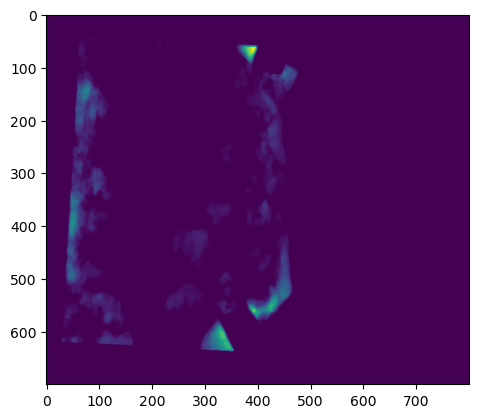

In [24]:
plt.imshow(params_results['200']['02']['front']['image'])

# Old routines

## GFD

In [ ]:
# Volume sizes for GFD_100mV, GFD_200mV, GFD_300mV
volume_sizes = [(777, 627, 500), (778,629,500), (776, 635, 500)]
frame = '02'

In [104]:
d = 0
GFD100 = read_3d_volume(input_path / f'GFD_100mV_tomo_{frame}_air.raw', volume_sizes[d][0], volume_sizes[d][1], volume_sizes[d][2], np.uint8)

d = 1 
GFD200 = read_3d_volume(input_path / f'GFD_200mV_tomo_{frame}_air.raw', volume_sizes[d][0], volume_sizes[d][1], volume_sizes[d][2], np.uint8)

d = 2 
GFD300 = read_3d_volume(input_path / f'GFD_300mV_tomo_{frame}_air.raw', volume_sizes[d][0], volume_sizes[d][1], volume_sizes[d][2], np.uint8)

In [70]:
membrane = read_3d_volume(input_path / 'GFD_100mV_tomo_01_mem.raw', nx, ny, nz, np.uint8)
#gaskets = read_3d_volume(input_path / 'gaskets.raw', nx, ny, nz, np.uint8)

In [21]:
i = 200

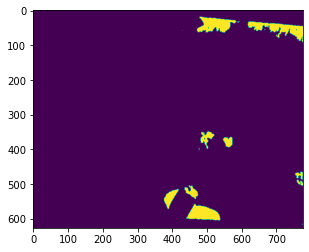

In [69]:
plt.imshow(vol[i])

In [106]:
GFD100_proj1, GFD100_proj2, GFD100_proj3 = make_three_projections(GFD100)
GFD200_proj1, GFD200_proj2, GFD200_proj3 = make_three_projections(GFD200)
GFD300_proj1, GFD300_proj2, GFD300_proj3 = make_three_projections(GFD300)

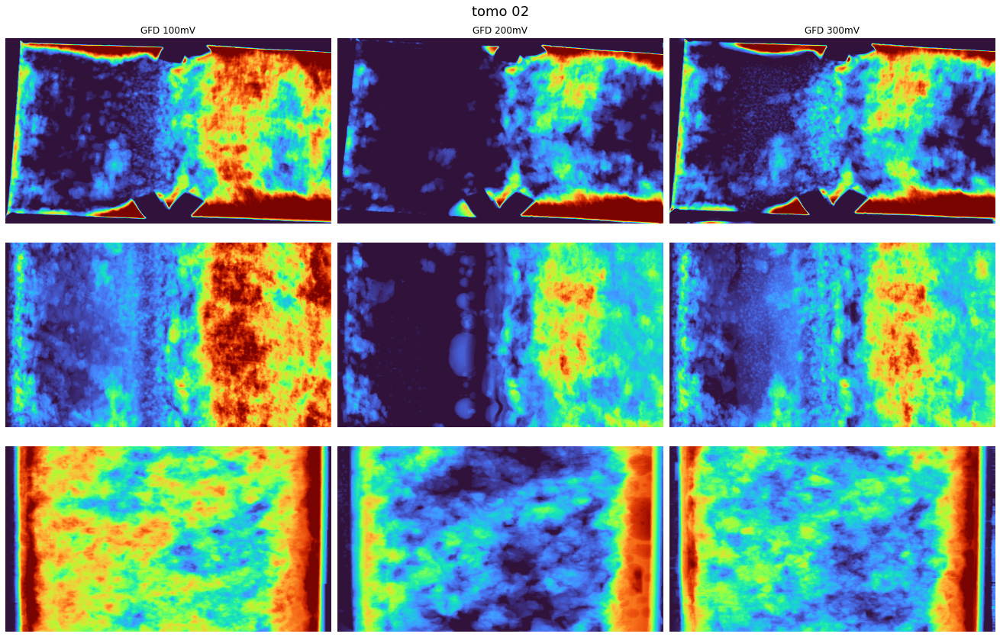

In [107]:
fig = plt.figure()

fig.set_size_inches(18, 12, forward=True)
plt.subplots_adjust(top=0.90, bottom=0.0, left=0.0, right=1.0, wspace=0.02, hspace=0.1 )

gs = gridspec.GridSpec(3, 3)


# Projection 1
proj1_mean = np.max([GFD100_proj1[1], GFD200_proj1[1], GFD300_proj1[1]])
proj1_std = np.max([GFD100_proj1[2], GFD200_proj1[2], GFD300_proj1[2]])             
v = proj1_mean+v_scale*proj1_std

im = GFD100_proj1[0]
im[im>v] = v
ax0 = plt.subplot(gs[0, 0])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')
plt.title('GFD 100mV')
#ax0.set_ylabel('100')
#ax0.text(0.5, 0.5, 'top view', va="center", ha="center", fontsize=16)
#ax0.text(0.5, 0.5,"top", va="center", ha="center", fontsize=16)

im = GFD200_proj1[0]
im[im>v] = v
ax1 = plt.subplot(gs[0, 1])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')
plt.title('GFD 200mV')
#plt.show()

im = GFD300_proj1[0]
im[im>v] = v
ax2 = plt.subplot(gs[0, 2])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')
plt.title('GFD 300mV')

# Projection 2
proj2_mean = np.max([GFD100_proj2[1], GFD200_proj2[1], GFD300_proj2[1]])
proj2_std = np.max([GFD100_proj2[2], GFD200_proj2[2], GFD300_proj2[2]])             
v = proj2_mean+v_scale*proj2_std

im = GFD100_proj2[0]
im[im>v] = v
ax3 = plt.subplot(gs[2, 0])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')

im = GFD200_proj2[0]
im[im>v] = v
ax4 = plt.subplot(gs[2, 1])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')

im = GFD300_proj2[0]
im[im>v] = v
ax5 = plt.subplot(gs[2, 2])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')
#plt.show()


# Projection 3
proj3_mean = np.max([GFD100_proj3[1], GFD200_proj3[1], GFD300_proj3[1]])
proj3_std = np.max([GFD100_proj3[2], GFD200_proj3[2], GFD300_proj3[2]])             
v = proj3_mean+v_scale*proj3_std

im = GFD100_proj3[0]
im[im>v] = v
ax6 = plt.subplot(gs[1, 0])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')

im = GFD200_proj3[0]
im[im>v] = v
ax7 = plt.subplot(gs[1, 1])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')

im = GFD300_proj3[0]
im[im>v] = v
ax8 = plt.subplot(gs[1, 2])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')

fig.suptitle(f'tomo {frame}', x=0.5, y=0.95, fontsize=18, va='top')

fig.savefig(input_path / f'GFD_projections_tomo{frame}.png')
#plt.show()

## GFA

In [114]:
# Volume sizes for GFA_300mV
volume_sizes = [(577, 530, 590)]
frame = '02'

d = 0
GFA300 = read_3d_volume(input_path / f'GFA_300mV_tomo_{frame}_air.raw', volume_sizes[d][0], volume_sizes[d][1], volume_sizes[d][2], np.uint8)

In [115]:
GFA300_proj1, GFA300_proj2, GFA300_proj3 = make_three_projections(GFA300)

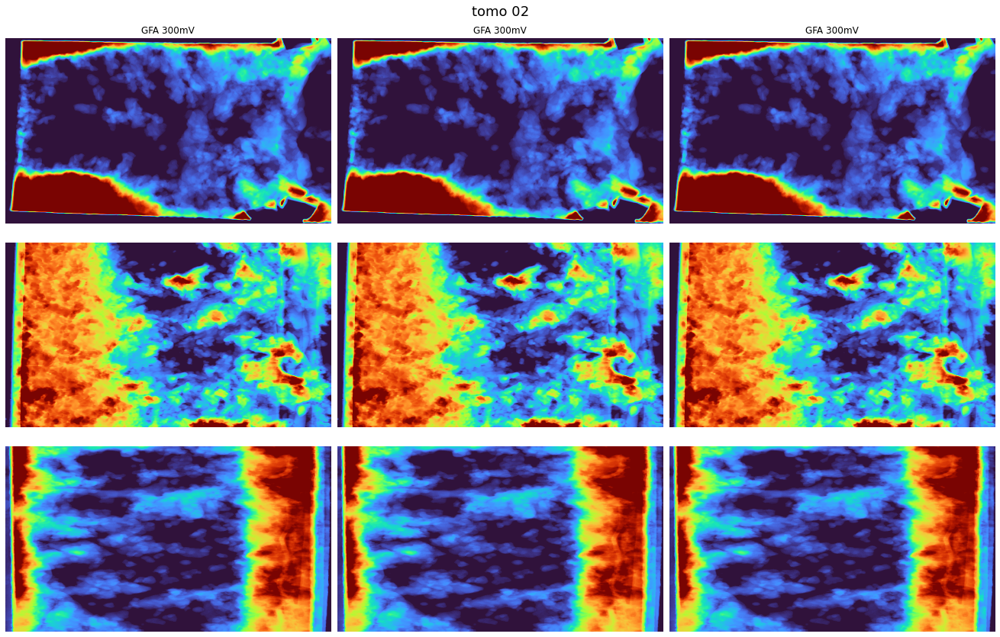

In [116]:
fig = plt.figure()

fig.set_size_inches(18, 12, forward=True)
plt.subplots_adjust(top=0.90, bottom=0.0, left=0.0, right=1.0, wspace=0.02, hspace=0.1 )

gs = gridspec.GridSpec(3, 3)


# Projection 1
proj1_mean = GFA300_proj1[1]
proj1_std = GFA300_proj1[2]           
v = proj1_mean+v_scale*proj1_std

im = GFA300_proj1[0]
im[im>v] = v
ax0 = plt.subplot(gs[0, 0])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')
plt.title('GFA 300mV')
#ax0.set_ylabel('100')
#ax0.text(0.5, 0.5, 'top view', va="center", ha="center", fontsize=16)
#ax0.text(0.5, 0.5,"top", va="center", ha="center", fontsize=16)

#im = GFD200_proj1[0]
#im[im>v] = v
ax1 = plt.subplot(gs[0, 1])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')
plt.title('GFA 300mV')


#im = GFD300_proj1[0]
#im[im>v] = v
ax2 = plt.subplot(gs[0, 2])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')
plt.title('GFA 300mV')

# Projection 2
proj2_mean = GFA300_proj2[1]
proj2_std = GFA300_proj2[2]         
v = proj2_mean+v_scale*proj2_std

im = GFA300_proj2[0]
im[im>v] = v
ax3 = plt.subplot(gs[2, 0])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')

#im = GFD200_proj2[0]
#im[im>v] = v
ax4 = plt.subplot(gs[2, 1])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')

#im = GFD300_proj2[0]
#im[im>v] = v
ax5 = plt.subplot(gs[2, 2])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')


# Projection 3
proj3_mean = GFA300_proj3[1]
proj3_std = GFA300_proj3[2]           
v = proj3_mean+v_scale*proj3_std

im = GFA300_proj3[0]
im[im>v] = v
ax6 = plt.subplot(gs[1, 0])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')

#im = GFD200_proj3[0]
#im[im>v] = v
ax7 = plt.subplot(gs[1, 1])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')

#im = GFD300_proj3[0]
#im[im>v] = v
ax8 = plt.subplot(gs[1, 2])
plt.axis('off')
plt.imshow(im, cmap='turbo', aspect='auto')

fig.suptitle(f'tomo {frame}', x=0.5, y=0.95, fontsize=18, va='top')

fig.savefig(input_path / f'GFA_projections_tomo{frame}.png')
#plt.show()

## Testing

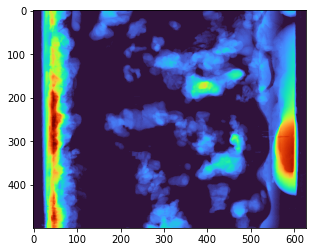

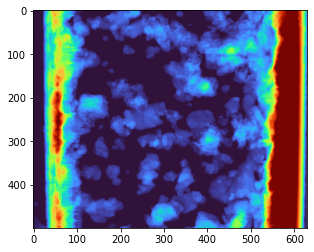

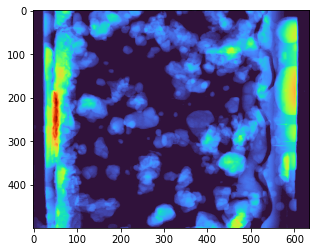

In [11]:
# Projection 2
proj2_mean = np.max([GFD100_proj2[1], GFD200_proj2[1], GFD300_proj2[1]])
proj2_std = np.max([GFD100_proj2[2], GFD200_proj2[2], GFD300_proj2[2]])             
v = proj2_mean+v_scale*proj2_std

im = GFD100_proj2[0]
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()

im = GFD200_proj2[0]
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()

im = GFD300_proj2[0]
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()

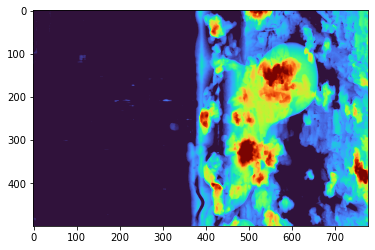

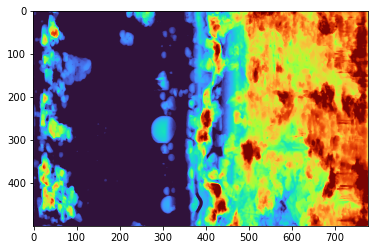

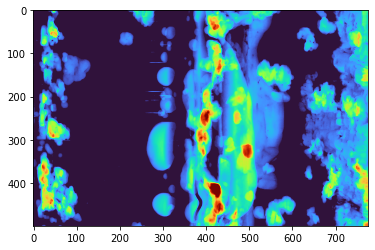

In [12]:
# Projection 3
proj3_mean = np.max([GFD100_proj3[1], GFD200_proj3[1], GFD300_proj3[1]])
proj3_std = np.max([GFD100_proj3[2], GFD200_proj3[2], GFD300_proj3[2]])             
v = proj3_mean+v_scale*proj3_std

im = GFD100_proj3[0]
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()

im = GFD200_proj3[0]
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()

im = GFD300_proj3[0]
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()

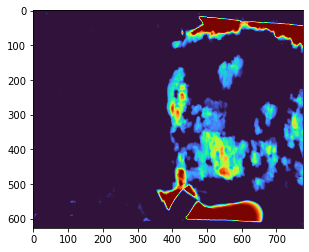

Mean 2727.594535068219
Max 32821


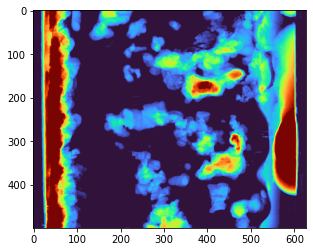

Mean 5446.673598086124
Max 27618


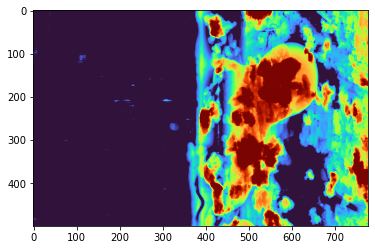

Mean 4638.055096525097
Max 20517


In [93]:
vol=vol1

im = project_front(vol)

v_scale = 2.0

v = np.mean(im)+v_scale*np.std(im)
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()
print('Mean', np.mean(im))
print('Max', np.max(im))

im = project_left(vol)
v = np.mean(im)+v_scale*np.std(im)
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()
print('Mean', np.mean(im))
print('Max', np.max(im))

im = project_top(vol)
v = np.mean(im)+v_scale*np.std(im)
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()
print('Mean', np.mean(im))
print('Max', np.max(im))

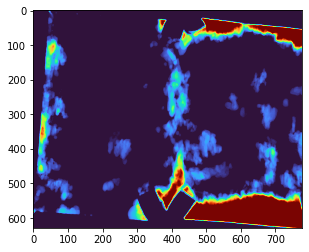

Mean 6481.822652760125
Max 63062


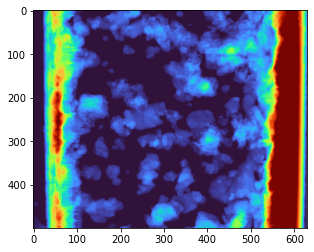

Mean 12744.227370429253
Max 60567


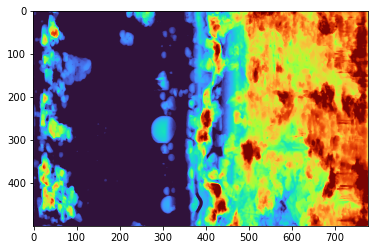

Mean 11535.793508997429
Max 34813


In [99]:
vol=vol3

im = project_front(vol)

v_scale = 2.0

v = np.mean(im)+v_scale*np.std(im)
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()
print('Mean', np.mean(im))
print('Max', np.max(im))

im = project_left(vol)
v = np.mean(im)+v_scale*np.std(im)
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()
print('Mean', np.mean(im))
print('Max', np.max(im))

im = project_top(vol)
v = np.mean(im)+v_scale*np.std(im)
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()
print('Mean', np.mean(im))
print('Max', np.max(im))

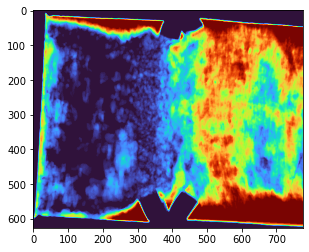

Mean 37239.04912157544
Mean 39081.4133284758
Max 117924


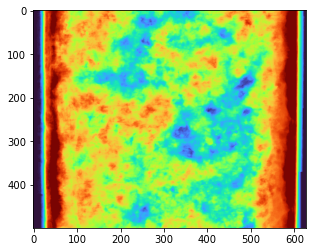

Mean 58204.852137161084
Max 111035


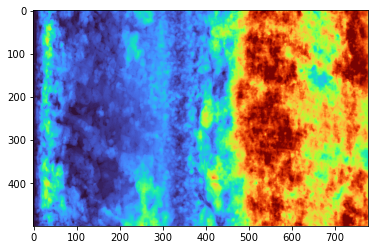

Mean 47226.33205405405
Max 120777


In [92]:
vol=vol2

im = project_front(vol)

v_scale = 2.0

v = np.mean(im)+v_scale*np.std(im)
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()
print('Mean', np.mean(im))
print('Mean', np.std(im))
print('Max', np.max(im))

im = project_left(vol)
v = np.mean(im)+v_scale*np.std(im)
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()
print('Mean', np.mean(im))
print('Max', np.max(im))

im = project_top(vol)
v = np.mean(im)+v_scale*np.std(im)
im[im>v] = v
plt.imshow(im, cmap='turbo')
plt.show()
print('Mean', np.mean(im))
print('Max', np.max(im))

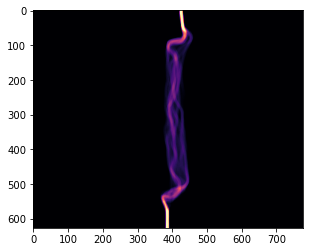

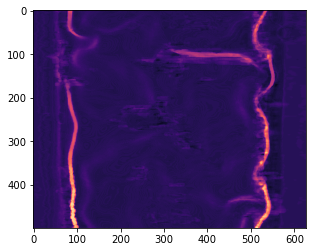

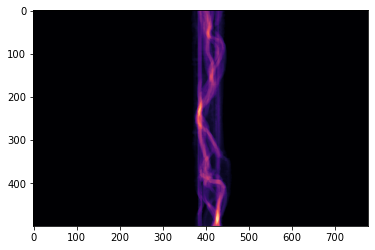

In [71]:
im = project_front(membrane)
plt.imshow(im, cmap='magma')
plt.show()

im = project_left(membrane)
plt.imshow(im, cmap='magma')
plt.show()

im = project_top(membrane)
plt.imshow(im, cmap='magma')
plt.show()

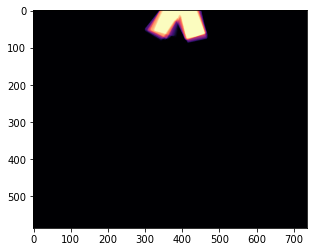

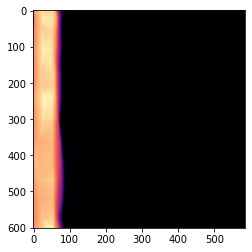

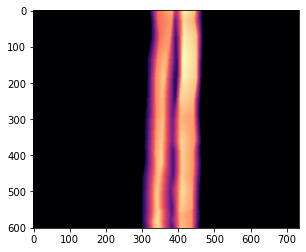

In [64]:
im = project_front(gaskets)
plt.imshow(im, cmap='magma')
plt.show()

im = project_left(gaskets)
plt.imshow(im, cmap='magma')
plt.show()

im = project_top(gaskets)
plt.imshow(im, cmap='magma')
plt.show()

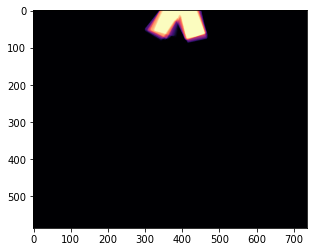

In [26]:
plt.imshow(np.sum(gaskets, axis=0), cmap='magma')

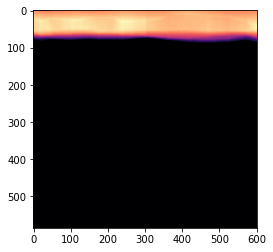

In [34]:
gaskets_rot = np.transpose(gaskets)
plt.imshow(np.sum(gaskets_rot, axis=0), cmap='magma')

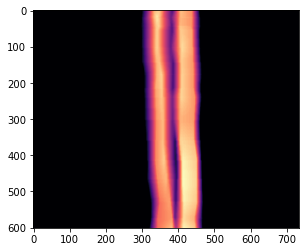

In [33]:
gaskets_rot2 = np.transpose(gaskets, axes=(1,0,2))
plt.imshow(np.sum(gaskets_rot2, axis=0), cmap='magma')

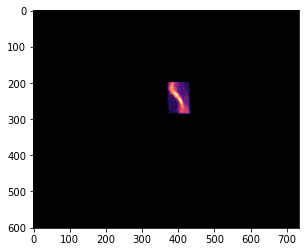

In [35]:
membrane_rot2 = np.transpose(membrane, axes=(1,0,2))
plt.imshow(np.sum(membrane_rot2, axis=0), cmap='magma')

In [9]:
input_path = Path('z:\\collaborations\\ulm-batteries\\processed\\A2021-031-019033\\Experiment2_bis\\')


slice_num = 500
trim_diff_value = -50

geometry = "GFD"
#geometry = "GDL"
#geometry = "GFA"

dataset = f"{geometry}_100mV_bis"
im1_100 = read_slice_from_multi_tiff(input_path / dataset / f"{dataset}_tomo_0{1}-slices-pr_scaled2_8bit.tif", slice_num)
im2_100 = read_slice_from_multi_tiff(input_path / dataset / f"{dataset}_tomo_0{2}-slices-pr_scaled2_8bit.tif", slice_num)
diff_100 = im1_100.astype(float)-im2_100.astype(float)
diff_100[diff_100 < trim_diff_value] = trim_diff_value

dataset = f"{geometry}_200mV"
im1_200 = read_slice_from_multi_tiff(input_path / dataset / f"{dataset}_tomo_0{1}-slices-pr_scaled2_8bit.tif", slice_num)
im2_200 = read_slice_from_multi_tiff(input_path / dataset / f"{dataset}_tomo_0{2}-slices-pr_scaled2_8bit.tif", slice_num)
diff_200 = im1_200.astype(float)-im2_200.astype(float)
diff_200[diff_200 < trim_diff_value] = trim_diff_value

dataset = f"{geometry}_300mV"
im1_300 = read_slice_from_multi_tiff(input_path / dataset / f"{dataset}_tomo_0{1}-slices-pr_scaled2_8bit.tif", slice_num)
im2_300 = read_slice_from_multi_tiff(input_path / dataset / f"{dataset}_tomo_0{2}-slices-pr_scaled2_8bit.tif", slice_num)
diff_300 = im1_300.astype(float)-im2_300.astype(float)
diff_300[diff_300 < trim_diff_value] = trim_diff_value


## Overview

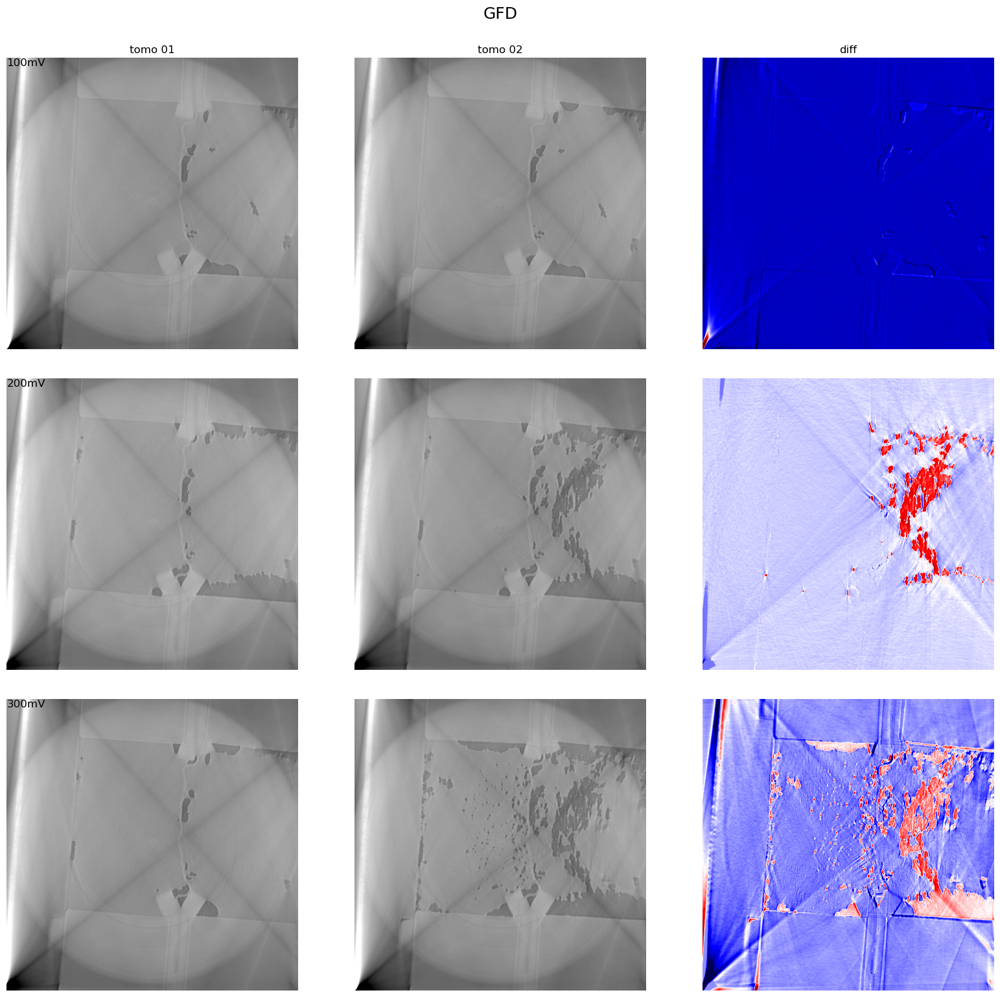

In [10]:
fig = plt.figure()

fig.set_size_inches(16, 16, forward=True)
plt.subplots_adjust(top=0.90, bottom=0.0, left=0.0, right=1.0, wspace=0.02, hspace=0.1 )

gs = gridspec.GridSpec(3, 3)

ax0 = plt.subplot(gs[0, 0])
plt.axis('off')
plt.imshow(im1_100, cmap='gray')
plt.title('tomo 01')
#ax0.set_ylabel('100')
ax0.text(0.2, 0.2, '100mV', va="top", ha="left", fontsize=12)
#ax0.text(0.5, 0.5, 'top view2', va="center", ha="center", fontsize=16)
#ax0.text(0.5, 0.5,"top", va="center", ha="center", fontsize=16)

ax1 = plt.subplot(gs[0, 1])
plt.axis('off')
plt.imshow(im2_100, cmap='gray')
plt.title('tomo 02')

ax2 = plt.subplot(gs[0, 2])
plt.axis('off')
plt.imshow(diff_100, cmap='seismic')
plt.title('diff')

ax3 = plt.subplot(gs[1, 0])
plt.axis('off')
plt.imshow(im1_200, cmap='gray')
ax3.text(0.2, 0.2, '200mV', va="top", ha="left", fontsize=12)

ax4 = plt.subplot(gs[1, 1])
plt.axis('off')
plt.imshow(im2_200, cmap='gray')

ax5 = plt.subplot(gs[1, 2])
plt.axis('off')
plt.imshow(diff_200, cmap='seismic')



ax6 = plt.subplot(gs[2, 0])
plt.axis('off')
plt.imshow(im1_300, cmap='gray')
ax6.text(0.0, 0.0, '300mV', va="top", ha="left", fontsize=12)

ax7 = plt.subplot(gs[2, 1])
plt.axis('off')
plt.imshow(im2_300, cmap='gray')

ax8 = plt.subplot(gs[2, 2])
plt.axis('off')
plt.imshow(diff_300, cmap='seismic')


fig.suptitle(f'{geometry}', x=0.5, y=0.95, fontsize=18, va='top')

fig.savefig(input_path / f'overview_{geometry}.png')
plt.show()

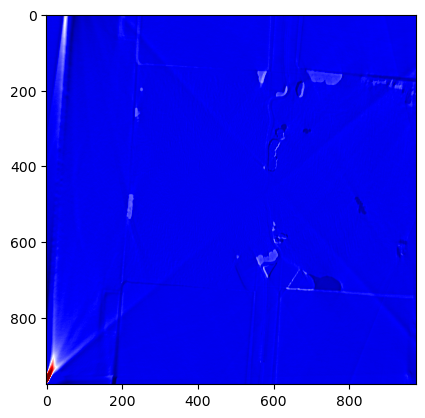

In [13]:
plt.imshow(im1_100.astype(float) - im1_300.astype(float), cmap='seismic')

In [43]:
electr_mask.shape

(500, 700, 800)

In [44]:
img_45 = rotate(electr_mask, 4.0, reshape=False, axes=(1,2))

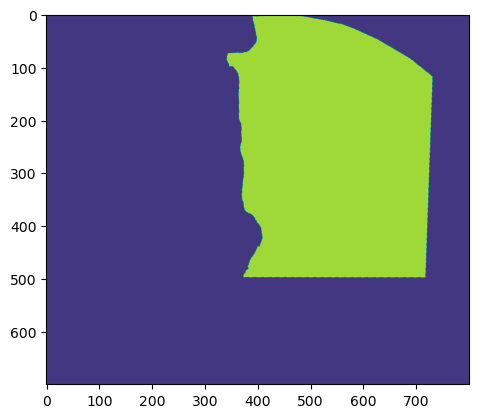

In [45]:
plt.imshow(img_45[200])